In [1]:
!pip install super-gradients==3.2.0
!pip install imutils
!pip install pytube --upgrade
!pip install torchinfo

In [2]:
from super_gradients.training import models
from torchinfo import summary

[2024-03-21 09:07:16] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-03-21 09:07:19] INFO - utils.py - NumExpr defaulting to 8 threads.
[2024-03-21 09:07:21] WARNING - __init__.py - Failed to import pytorch_quantization
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2024-03-21 09:07:25] WARNING - calibrator.py - Failed to import pytorch_quantization
[2024-03-21 09:07:25] WARNING - export.py - Failed to import pytorch_quantization
[2024-03-21 09:07:25] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [3]:
yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco")

[2024-03-21 09:07:26] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:00<00:00, 381MB/s]
[2024-03-21 09:07:27] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [4]:
summary(model=yolo_nas_l,
        input_size=(16, 3, 640, 640),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

## Inference


[2024-03-21 09:07:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


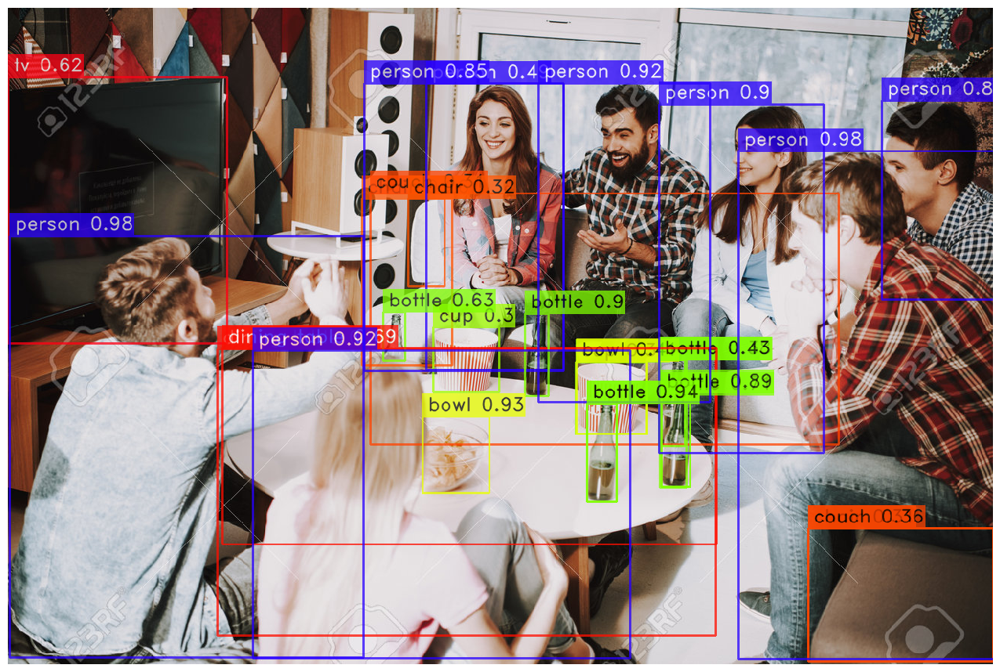

In [5]:
url = "https://previews.123rf.com/images/freeograph/freeograph2011/freeograph201100150/158301822-group-of-friends-gathering-around-table-at-home.jpg"
yolo_nas_l.predict(url, conf=0.25).show()

In [6]:
!gdown "https://drive.google.com/uc?id=1q-sNrJfUi6PjvT8mFfEw1Cq4eCavdklK&confirm=t"

[2024-03-21 09:07:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Downloading...
From: https://drive.google.com/uc?id=1q-sNrJfUi6PjvT8mFfEw1Cq4eCavdklK&confirm=t
To: /content/image1.jpg
100% 214k/214k [00:00<00:00, 109MB/s]


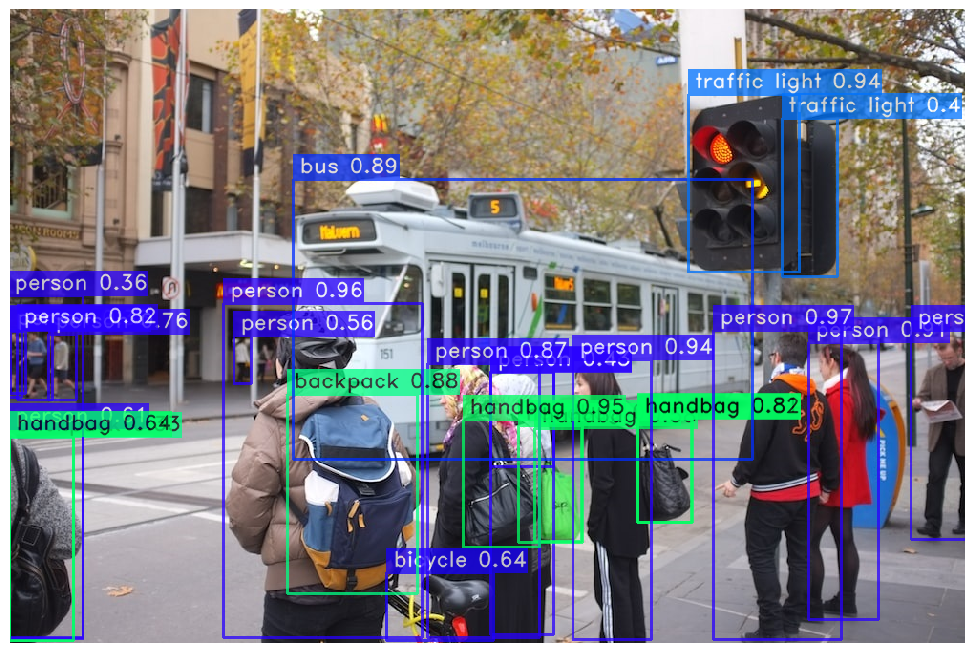

In [7]:
image_path = "/content/image1.jpg"
yolo_nas_l.predict(image_path, conf=0.25).show()

In [8]:
!gdown "https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t
To: /content/demo.mp4
100% 11.5M/11.5M [00:00<00:00, 127MB/s]


In [9]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

input_video_path = "/content/demo.mp4"
output_video_path = "detections.mp4"

yolo_nas_l.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 1314/1314 [00:17<00:00, 75.70it/s]


In [10]:
!rm '/content/result_compressed.mp4'

In [11]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/detections.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)